### Code

In [1]:
import os
import json
import copy
import torch
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import torch.nn.functional as F
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, f1_score

import warnings
warnings.filterwarnings('ignore')


In [2]:
def class_wise_accuracy(y_true, y_pred):
    """
    Computes class-wise accuracy given true and predicted labels.
    
    Args:
        y_true (array-like): True labels.
        y_pred (array-like): Predicted labels.
        
    Returns:
        float: Mean class-wise accuracy.
    """
    unique_classes = np.sort(np.unique(y_true))
    class_accuracies = []
    
    for cls in unique_classes:
        cls_mask = (y_true == cls)
        cls_correct = np.sum(y_pred[cls_mask] == y_true[cls_mask])
        cls_total = np.sum(cls_mask)
        
        if cls_total > 0:
            class_accuracies.append(cls_correct / cls_total)
        else:
            class_accuracies.append(0)
    
    return np.mean(class_accuracies), class_accuracies


In [3]:
def class_wise_mae(y_true, y_pred):
    """
    Computes class-wise Mean Absolute Error (MAE) for an ordinal classification problem.
    
    Args:
        y_true (array-like): True labels.
        y_pred (array-like): Predicted labels.
        
    Returns:
        float: Mean class-wise MAE.
    """
    unique_classes = np.sort(np.unique(y_true))
    class_maes = []
    
    for cls in unique_classes:
        cls_mask = (y_true == cls)
        cls_errors = np.abs(y_pred[cls_mask] - y_true[cls_mask])
        cls_total = np.sum(cls_mask)
        
        if cls_total > 0:
            class_maes.append(np.mean(cls_errors))
        else:
            class_maes.append(0)
    
    return np.mean(class_maes), class_maes

In [4]:
def macro_f1_score(y_true, y_pred):
    """
    Computes the macro-averaged F1-score.
    
    Args:
        y_true (array-like): True labels.
        y_pred (array-like): Predicted labels.
        
    Returns:
        float: Macro-averaged F1-score.
    """
    return f1_score(y_true, y_pred, average='macro')

In [5]:
def report_accuracy(data_root, result_root, experiments):
    # Iterate over experiments
    for exp in experiments:
        print(f"{exp}")
        accs = {'trn': [], 'val': [], 'tst': []}
        class_accs = {'trn': [], 'val': [], 'tst': []}
        maes = {'trn': [], 'val': [], 'tst': []}
        class_maes = {'trn': [], 'val': [], 'tst': []}
        f1s = {'trn': [], 'val': [], 'tst': []}

        fig, axes = plt.subplots(1, 5, figsize=(20, 4))  # Create a row of 5 subplots for confusion matrices

        for split in range(5):
            # Load data file
            df = pd.read_csv(os.path.join(data_root, exp, f"data_split{split}.csv"), header=None)
            # Load evaluation file
            eval_path = os.path.join(result_root, exp, f"split{split}", 'evaluation.pt')
            ev = torch.load(eval_path)

            # Extract necessary data
            id_list = ev['id']
            folder_list = ev['folder']
            # true_label = np.array(ev['true_label']['age'])
            y_true = df[3].to_numpy()
            if exp.startswith('Adience'):
                y_pred = np.array(ev['predicted_label']['age'])
            elif exp.startswith('DR'):
                y_pred = np.array(ev['predicted_label']['level'])

            # Filter test indices where folder == 2
            trn_indices = [i for i in range(len(id_list)) if folder_list[i] == 0]
            val_indices = [i for i in range(len(id_list)) if folder_list[i] == 1]
            tst_indices = [i for i in range(len(id_list)) if folder_list[i] == 2]

            # Compute accuracy
            trn_acc, trn_accs = class_wise_accuracy(y_true[trn_indices], y_pred[trn_indices])
            val_acc, val_accs = class_wise_accuracy(y_true[val_indices], y_pred[val_indices])
            tst_acc, tst_accs = class_wise_accuracy(y_true[tst_indices], y_pred[tst_indices])
            # print(f"split-{split}:\n\tacc: {test_accuracy:.4f}, {[round(tst_acc, 4) for tst_acc in test_accuracies]}")
            accs['trn'].append(trn_acc)
            accs['val'].append(val_acc)
            accs['tst'].append(tst_acc)
            class_accs['trn'].append(trn_accs)
            class_accs['val'].append(val_accs)
            class_accs['tst'].append(tst_accs)

            # Compute MAE
            trn_mae, trn_maes = class_wise_mae(y_true[trn_indices], y_pred[trn_indices])
            val_mae, val_maes = class_wise_mae(y_true[val_indices], y_pred[val_indices])
            tst_mae, tst_maes = class_wise_mae(y_true[tst_indices], y_pred[tst_indices])
            # print(f"\tmae: {test_mae:.4f}, {[round(tst_mae, 4) for tst_mae in test_maes]}")
            maes['trn'].append(trn_mae)
            maes['val'].append(val_mae)
            maes['tst'].append(tst_mae)
            class_maes['trn'].append(trn_maes)
            class_maes['val'].append(val_maes)
            class_maes['tst'].append(tst_maes)

            # Compute F1 Score
            trn_f1 = macro_f1_score(y_true[trn_indices], y_pred[trn_indices])
            val_f1 = macro_f1_score(y_true[val_indices], y_pred[val_indices])
            tst_f1 = macro_f1_score(y_true[tst_indices], y_pred[tst_indices])
            # print(f"\tf1: {test_f1:.4f}", end='\n')
            f1s['trn'].append(trn_f1)
            f1s['val'].append(val_f1)
            f1s['tst'].append(tst_f1)
            
            # Plot confusion matrix
            cm = confusion_matrix(y_true[tst_indices], y_pred[tst_indices], labels=np.arange(len(tst_accs)), normalize='true')
            sns.heatmap(cm, annot=True, fmt='.2f', cmap='Blues', xticklabels=np.arange(len(tst_accs)), yticklabels=np.arange(len(tst_accs)), ax=axes[split])
            axes[split].set_title(f"Split {split}")
            axes[split].set_xlabel("Predicted")
            axes[split].set_ylabel("True")

        # Compute mean and std accuracy over splits
        print(f"trn|val|tst accs: {np.mean(accs['trn']):.4f} ± {np.std(accs['trn']):.4f} | {np.mean(accs['val']):.4f} ± {np.std(accs['val']):.4f} | {np.mean(accs['tst']):.4f} ± {np.std(accs['tst']):.4f}")

        # Compute mean and std mae over splits
        print(f"trn|val|tst maes: {np.mean(maes['trn']):.4f} ± {np.std(maes['trn']):.4f} | {np.mean(maes['val']):.4f} ± {np.std(maes['val']):.4f} | {np.mean(maes['tst']):.4f} ± {np.std(maes['tst']):.4f}")

        # Compute f1 and std mae over splits
        print(f"trn|val|tst f1s : {np.mean(f1s['trn']):.4f} ± {np.std(f1s['trn']):.4f} | {np.mean(f1s['val']):.4f} ± {np.std(f1s['val']):.4f} | {np.mean(f1s['tst']):.4f} ± {np.std(f1s['tst']):.4f}")

        plt.tight_layout()
        plt.show()  # Display confusion matrices
        print("\n" + "="*50 + "\n")


### DRUnder Experiments

DRUnder_256x256_resnet50_imagenet_dldl_v2_clean


trn|val|tst accs: 0.9053 ± 0.0743 | 0.4855 ± 0.0050 | 0.4509 ± 0.0136
trn|val|tst maes: 0.0985 ± 0.0790 | 0.6793 ± 0.0226 | 0.7324 ± 0.0268
trn|val|tst f1s : 0.9166 ± 0.0686 | 0.5091 ± 0.0047 | 0.4429 ± 0.0081


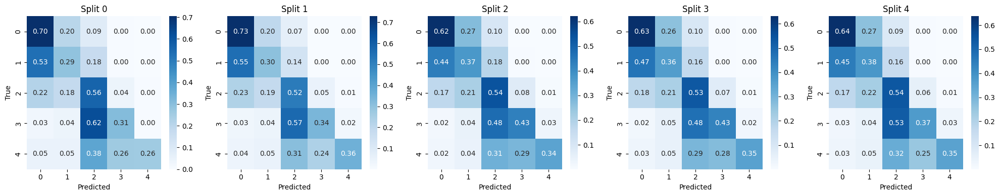



DRUnder_256x256_resnet50_imagenet_noisy_dldl_v2_clean_smcarl_v3
trn|val|tst accs: 0.7074 ± 0.0591 | 0.4940 ± 0.0151 | 0.4665 ± 0.0103
trn|val|tst maes: 0.3219 ± 0.0780 | 0.6373 ± 0.0195 | 0.6826 ± 0.0122
trn|val|tst f1s : 0.7074 ± 0.0585 | 0.5034 ± 0.0122 | 0.4446 ± 0.0097


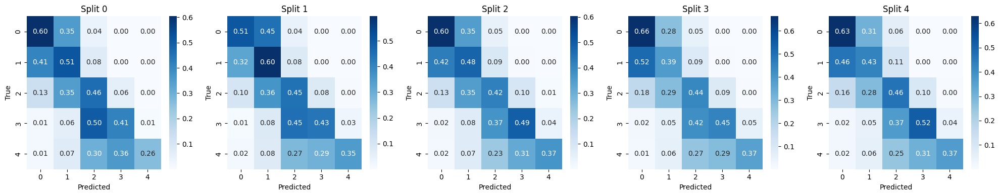



DRUnder_256x256_resnet50_imagenet_dldl_v2_clean_std50
trn|val|tst accs: 0.9425 ± 0.0599 | 0.4872 ± 0.0139 | 0.4527 ± 0.0119
trn|val|tst maes: 0.0595 ± 0.0628 | 0.6829 ± 0.0277 | 0.7401 ± 0.0266
trn|val|tst f1s : 0.9513 ± 0.0523 | 0.5130 ± 0.0104 | 0.4468 ± 0.0072


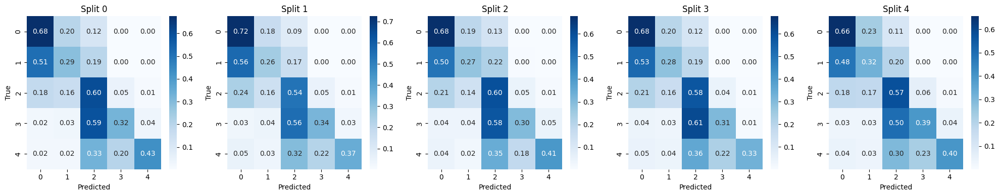



DRUnder_256x256_resnet50_imagenet_dldl_v2_noisy
trn|val|tst accs: 0.3272 ± 0.0338 | 0.2762 ± 0.0127 | 0.3452 ± 0.0236
trn|val|tst maes: 1.0153 ± 0.0677 | 1.1526 ± 0.0273 | 0.8488 ± 0.0493
trn|val|tst f1s : 0.2998 ± 0.0520 | 0.2431 ± 0.0271 | 0.2471 ± 0.0344


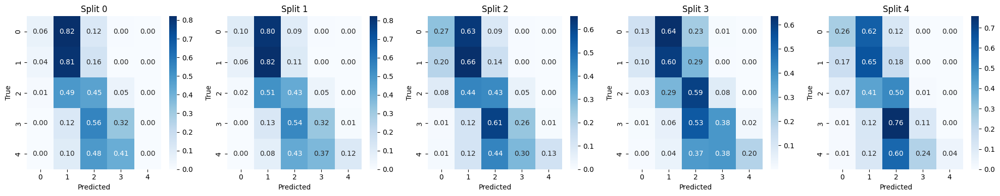



DRUnder_256x256_resnet50_imagenet_noisy_dldl_v2_smcarl_v3
trn|val|tst accs: 0.4018 ± 0.0937 | 0.2886 ± 0.0204 | 0.3722 ± 0.0323
trn|val|tst maes: 0.8578 ± 0.1933 | 1.1378 ± 0.0341 | 0.8015 ± 0.0620
trn|val|tst f1s : 0.3834 ± 0.1136 | 0.2630 ± 0.0358 | 0.2686 ± 0.0488


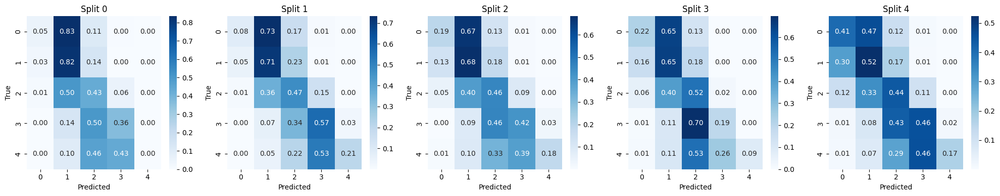



DRUnder_256x256_resnet50_imagenet_noisy_dldl_v2_smcarl_v3_std50
trn|val|tst accs: 0.3097 ± 0.0238 | 0.2724 ± 0.0098 | 0.3399 ± 0.0198
trn|val|tst maes: 1.0812 ± 0.0519 | 1.1798 ± 0.0290 | 0.8635 ± 0.0381
trn|val|tst f1s : 0.2875 ± 0.0358 | 0.2450 ± 0.0185 | 0.2585 ± 0.0360


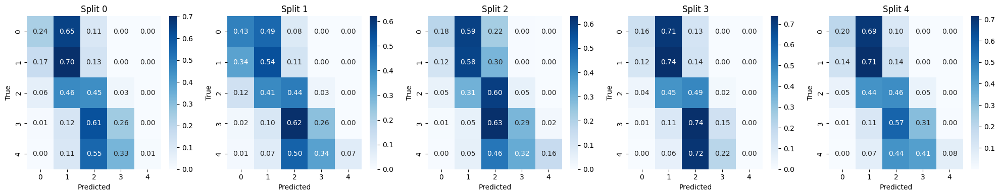



DRUnder_256x256_resnet50_imagenet_dldl_v2_nr2_noisy
trn|val|tst accs: 0.4402 ± 0.0504 | 0.3368 ± 0.0121 | 0.3894 ± 0.0176
trn|val|tst maes: 0.8026 ± 0.0860 | 1.0348 ± 0.0289 | 0.8025 ± 0.0260
trn|val|tst f1s : 0.4507 ± 0.0644 | 0.3392 ± 0.0239 | 0.3443 ± 0.0393


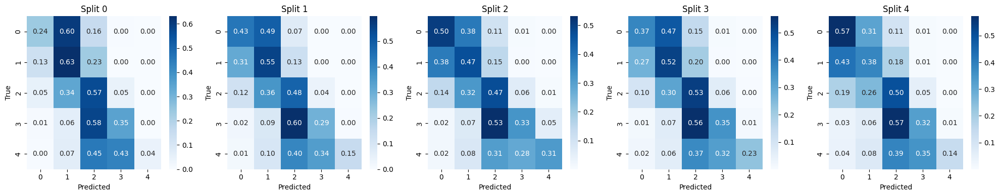



DRUnder_256x256_resnet50_imagenet_noisy_dldl_v2_nr2_smcarl_v3
trn|val|tst accs: 0.5335 ± 0.0184 | 0.3679 ± 0.0078 | 0.4363 ± 0.0088
trn|val|tst maes: 0.6292 ± 0.0271 | 0.9919 ± 0.0375 | 0.7114 ± 0.0202
trn|val|tst f1s : 0.5457 ± 0.0223 | 0.3736 ± 0.0096 | 0.3841 ± 0.0177


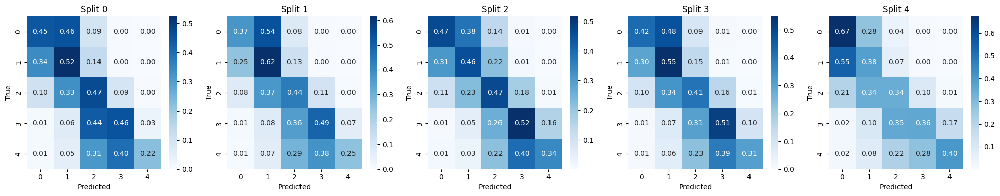

In [7]:
data_root = '../facebase/data'
result_root = '../facebase/results'
experiments = ['DRUnder_256x256_resnet50_imagenet_dldl_v2_clean',
               'DRUnder_256x256_resnet50_imagenet_noisy_dldl_v2_clean_smcarl_v3',
               'DRUnder_256x256_resnet50_imagenet_dldl_v2_clean_std50',
               'DRUnder_256x256_resnet50_imagenet_dldl_v2_noisy',
               'DRUnder_256x256_resnet50_imagenet_noisy_dldl_v2_smcarl_v3',
               'DRUnder_256x256_resnet50_imagenet_noisy_dldl_v2_smcarl_v3_std50',
               'DRUnder_256x256_resnet50_imagenet_dldl_v2_nr2_noisy',
               'DRUnder_256x256_resnet50_imagenet_noisy_dldl_v2_nr2_smcarl_v3',
               ]

report_accuracy(data_root, result_root, experiments)

### DR Experiments

DR_256x256_resnet50_imagenet_dldl_v2_clean
trn|val|tst accs: 0.9257 ± 0.0632 | 0.4629 ± 0.0121 | 0.4407 ± 0.0122
trn|val|tst maes: 0.0772 ± 0.0672 | 0.7753 ± 0.0289 | 0.8212 ± 0.0316
trn|val|tst f1s : 0.9410 ± 0.0540 | 0.5032 ± 0.0071 | 0.4754 ± 0.0066


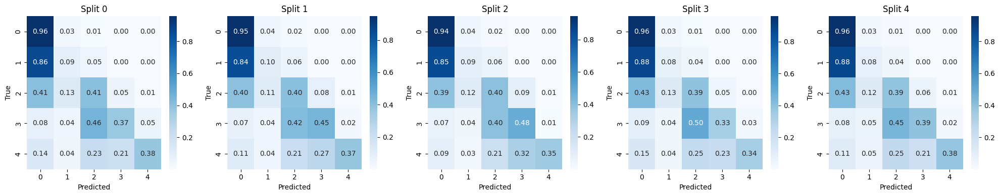



DR_256x256_resnet50_imagenet_dldl_v2_clean_new
trn|val|tst accs: 0.7346 ± 0.1709 | 0.4548 ± 0.0198 | 0.4285 ± 0.0138
trn|val|tst maes: 0.3051 ± 0.2072 | 0.7713 ± 0.0294 | 0.8302 ± 0.0251
trn|val|tst f1s : 0.7712 ± 0.1526 | 0.5011 ± 0.0157 | 0.4707 ± 0.0116


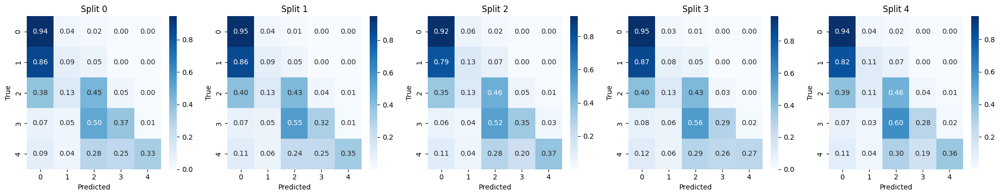



DR_256x256_resnet50_imagenet_dldl_v2_clean_oversampled
trn|val|tst accs: 0.9955 ± 0.0017 | 0.4618 ± 0.0173 | 0.4250 ± 0.0071
trn|val|tst maes: 0.0063 ± 0.0021 | 0.8191 ± 0.0432 | 0.8837 ± 0.0268
trn|val|tst f1s : 0.9955 ± 0.0017 | 0.5067 ± 0.0132 | 0.4649 ± 0.0040


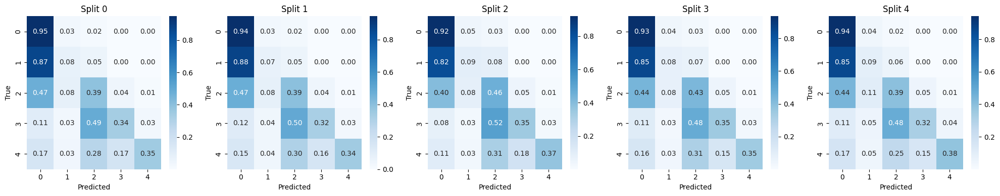



DR_256x256_resnet50_imagenet_dldl_v2_noisy
trn|val|tst accs: 0.2911 ± 0.0184 | 0.2510 ± 0.0023 | 0.3173 ± 0.0103
trn|val|tst maes: 1.3980 ± 0.0708 | 1.5580 ± 0.0237 | 1.0123 ± 0.0326
trn|val|tst f1s : 0.2814 ± 0.0216 | 0.2396 ± 0.0018 | 0.3163 ± 0.0149


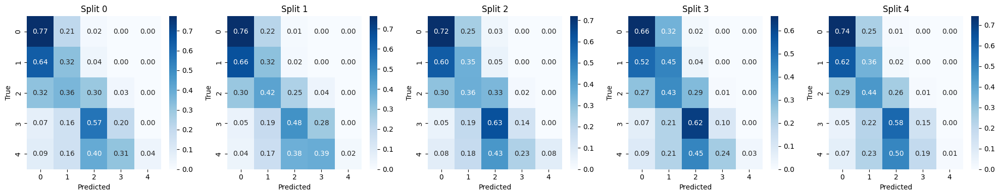



DR_256x256_resnet50_imagenet_noisy_dldl_v2_smcarl_v3
trn|val|tst accs: 0.3084 ± 0.0510 | 0.2504 ± 0.0023 | 0.3187 ± 0.0116
trn|val|tst maes: 1.3414 ± 0.1755 | 1.5784 ± 0.0391 | 1.0244 ± 0.0376
trn|val|tst f1s : 0.3052 ± 0.0666 | 0.2400 ± 0.0023 | 0.3192 ± 0.0182


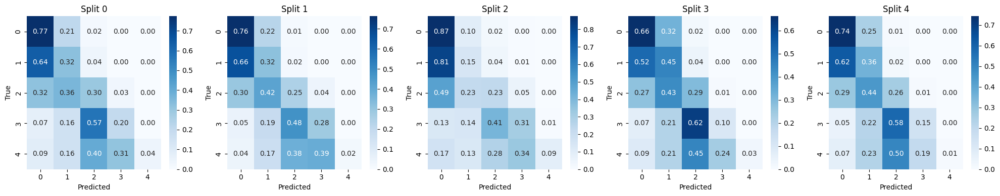



DR_256x256_resnet50_imagenet_noisy_dldl_v2_smcarl_v3_new
trn|val|tst accs: 0.3162 ± 0.0341 | 0.2580 ± 0.0071 | 0.3466 ± 0.0381
trn|val|tst maes: 1.3127 ± 0.1566 | 1.5581 ± 0.0256 | 0.9593 ± 0.0753
trn|val|tst f1s : 0.3173 ± 0.0428 | 0.2526 ± 0.0101 | 0.3547 ± 0.0285


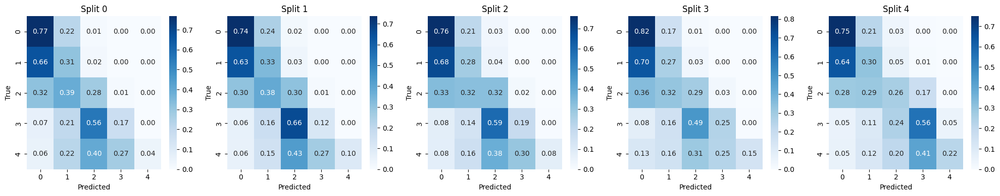



DR_256x256_resnet50_imagenet_dldl_v2_nr2_noisy
trn|val|tst accs: 0.3326 ± 0.0148 | 0.2960 ± 0.0147 | 0.3725 ± 0.0223
trn|val|tst maes: 1.2983 ± 0.0580 | 1.4309 ± 0.0427 | 0.9159 ± 0.0516
trn|val|tst f1s : 0.3560 ± 0.0173 | 0.3126 ± 0.0177 | 0.3984 ± 0.0141


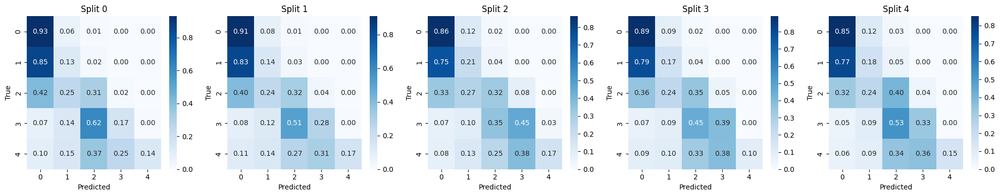



DR_256x256_resnet50_imagenet_noisy_dldl_v2_nr2_smcarl_v3
trn|val|tst accs: 0.3326 ± 0.0148 | 0.2960 ± 0.0147 | 0.3725 ± 0.0223
trn|val|tst maes: 1.2983 ± 0.0580 | 1.4309 ± 0.0427 | 0.9159 ± 0.0516
trn|val|tst f1s : 0.3560 ± 0.0173 | 0.3126 ± 0.0177 | 0.3984 ± 0.0141


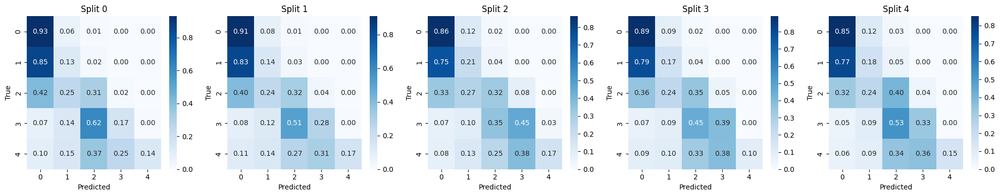

In [8]:
data_root = '../facebase/data'
result_root = '../facebase/results'
experiments = ['DR_256x256_resnet50_imagenet_dldl_v2_clean',
               'DR_256x256_resnet50_imagenet_dldl_v2_clean_new',
               'DR_256x256_resnet50_imagenet_dldl_v2_clean_oversampled',
               'DR_256x256_resnet50_imagenet_dldl_v2_noisy',
               'DR_256x256_resnet50_imagenet_noisy_dldl_v2_smcarl_v3',
               'DR_256x256_resnet50_imagenet_noisy_dldl_v2_smcarl_v3_new',
               'DR_256x256_resnet50_imagenet_dldl_v2_nr2_noisy',
               'DR_256x256_resnet50_imagenet_noisy_dldl_v2_nr2_smcarl_v3',
               ]

report_accuracy(data_root, result_root, experiments)

### Adience Experiments

Adience_256x256_resnet50_imagenet_dldl_v2_clean
trn|val|tst accs: 0.9402 ± 0.0367 | 0.4985 ± 0.0391 | 0.5063 ± 0.0221
trn|val|tst maes: 0.0615 ± 0.0382 | 0.6361 ± 0.0663 | 0.6343 ± 0.0505
trn|val|tst f1s : 0.9464 ± 0.0326 | 0.5030 ± 0.0367 | 0.5006 ± 0.0209


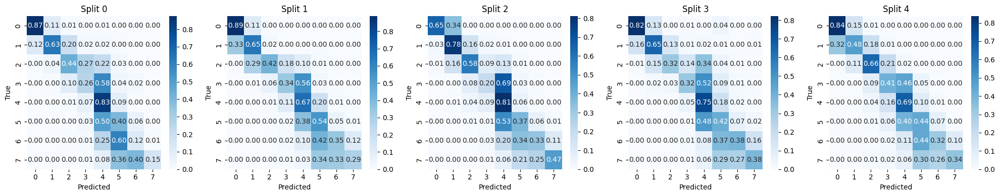



Adience_256x256_resnet50_imagenet_dldl_v2_noisy
trn|val|tst accs: 0.4327 ± 0.0480 | 0.2781 ± 0.0236 | 0.3929 ± 0.0279
trn|val|tst maes: 1.0444 ± 0.1160 | 1.4553 ± 0.0314 | 0.8649 ± 0.0382
trn|val|tst f1s : 0.4414 ± 0.0514 | 0.2771 ± 0.0267 | 0.3775 ± 0.0290


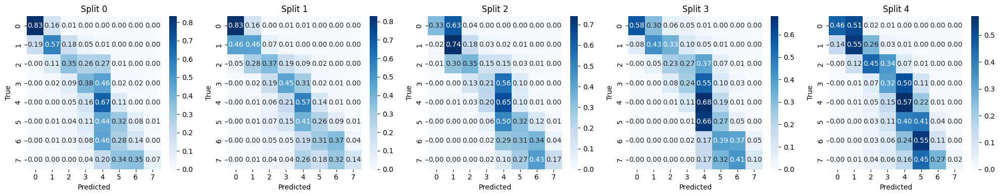



Adience_256x256_resnet50_imagenet_noisy_dldl_v2_clean_carl
trn|val|tst accs: 0.7736 ± 0.0919 | 0.5194 ± 0.0445 | 0.5234 ± 0.0186
trn|val|tst maes: 0.2340 ± 0.0968 | 0.6068 ± 0.0801 | 0.6033 ± 0.0362
trn|val|tst f1s : 0.7827 ± 0.0839 | 0.5203 ± 0.0507 | 0.5212 ± 0.0066


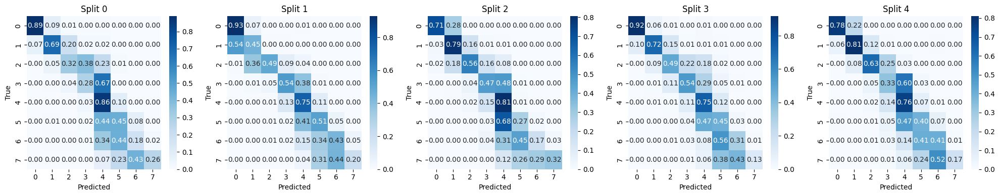



Adience_256x256_resnet50_imagenet_noisy_dldl_v2_smed_carl_v2
trn|val|tst accs: 0.5202 ± 0.0434 | 0.2942 ± 0.0226 | 0.4576 ± 0.0325
trn|val|tst maes: 0.7558 ± 0.0924 | 1.4165 ± 0.0433 | 0.7472 ± 0.0485
trn|val|tst f1s : 0.5326 ± 0.0434 | 0.3001 ± 0.0228 | 0.4531 ± 0.0243


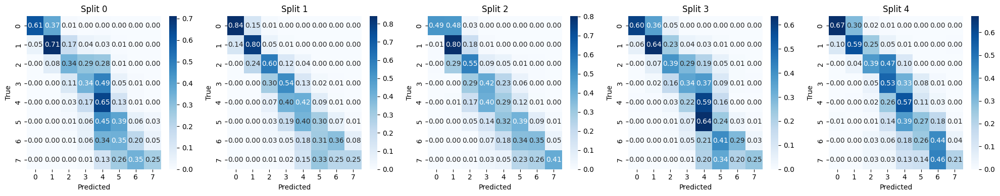



Adience_256x256_resnet50_imagenet_noisy_dldl_v2_clean_smcarl_v3
trn|val|tst accs: 0.8345 ± 0.0542 | 0.5516 ± 0.0237 | 0.5542 ± 0.0353
trn|val|tst maes: 0.1700 ± 0.0564 | 0.5551 ± 0.0432 | 0.5585 ± 0.0606
trn|val|tst f1s : 0.8290 ± 0.0523 | 0.5510 ± 0.0238 | 0.5477 ± 0.0308


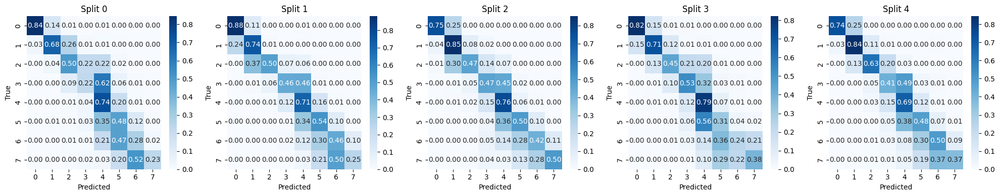



Adience_256x256_resnet50_imagenet_noisy_dldl_v2_smcarl_v3_noisy_test
trn|val|tst accs: 0.4764 ± 0.0289 | 0.3014 ± 0.0264 | 0.2963 ± 0.0317
trn|val|tst maes: 0.8432 ± 0.0694 | 1.4164 ± 0.0362 | 1.4148 ± 0.0732
trn|val|tst f1s : 0.4842 ± 0.0301 | 0.3010 ± 0.0254 | 0.2960 ± 0.0326


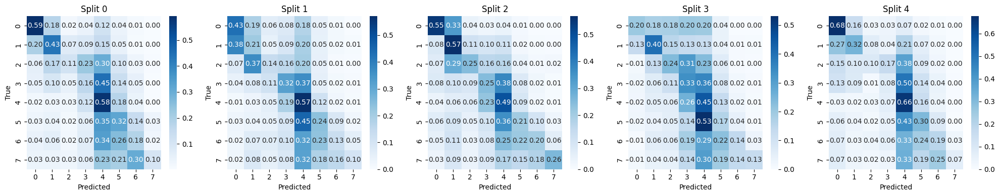



Adience_256x256_resnet50_imagenet_dldl_v2_noisy_test
trn|val|tst accs: 0.4327 ± 0.0480 | 0.2781 ± 0.0236 | 0.2611 ± 0.0266
trn|val|tst maes: 1.0444 ± 0.1160 | 1.4553 ± 0.0314 | 1.4820 ± 0.0650
trn|val|tst f1s : 0.4414 ± 0.0514 | 0.2771 ± 0.0267 | 0.2563 ± 0.0250


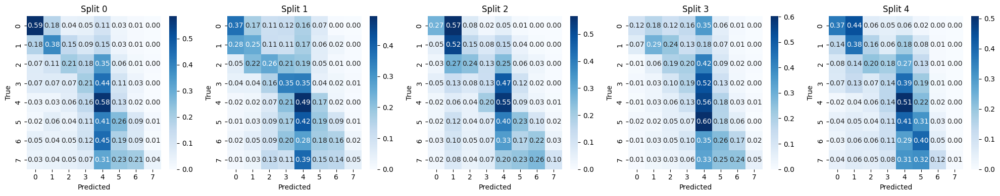



Adience_256x256_resnet50_imagenet_noisy_dldl_v2_nr2_smcarl_v3
trn|val|tst accs: 0.6207 ± 0.0460 | 0.3987 ± 0.0307 | 0.4988 ± 0.0226
trn|val|tst maes: 0.5615 ± 0.0826 | 1.0497 ± 0.0684 | 0.6463 ± 0.0394
trn|val|tst f1s : 0.6262 ± 0.0464 | 0.4057 ± 0.0262 | 0.4866 ± 0.0118


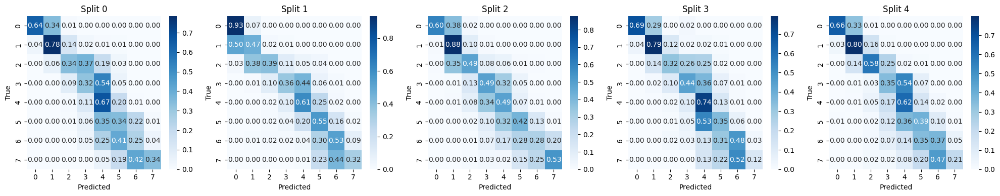



Adience_256x256_resnet50_imagenet_dldl_v2_clean_new_mae
trn|val|tst accs: 0.9694 ± 0.0138 | 0.5079 ± 0.0330 | 0.5165 ± 0.0093
trn|val|tst maes: 0.0316 ± 0.0144 | 0.6188 ± 0.0514 | 0.6134 ± 0.0399
trn|val|tst f1s : 0.9703 ± 0.0159 | 0.5031 ± 0.0322 | 0.5035 ± 0.0146


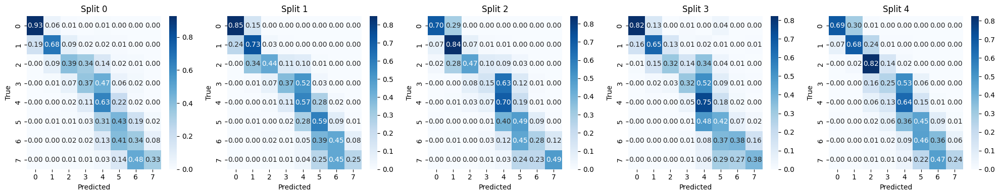



Adience_256x256_resnet50_imagenet_cjs_clean
trn|val|tst accs: 0.9551 ± 0.0549 | 0.5099 ± 0.0441 | 0.4982 ± 0.0303
trn|val|tst maes: 0.0461 ± 0.0561 | 0.6002 ± 0.0683 | 0.6182 ± 0.0553
trn|val|tst f1s : 0.9531 ± 0.0547 | 0.5103 ± 0.0364 | 0.4917 ± 0.0209


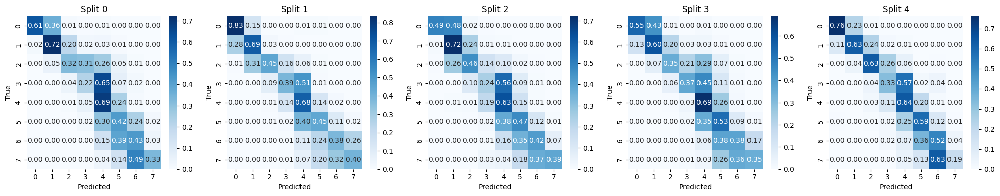



Adience_256x256_resnet50_imagenet_cjs_clean_wd1e-5
trn|val|tst accs: 0.9711 ± 0.0531 | 0.5150 ± 0.0314 | 0.5150 ± 0.0183
trn|val|tst maes: 0.0301 ± 0.0548 | 0.5983 ± 0.0560 | 0.6036 ± 0.0410
trn|val|tst f1s : 0.9708 ± 0.0536 | 0.5152 ± 0.0270 | 0.5091 ± 0.0188


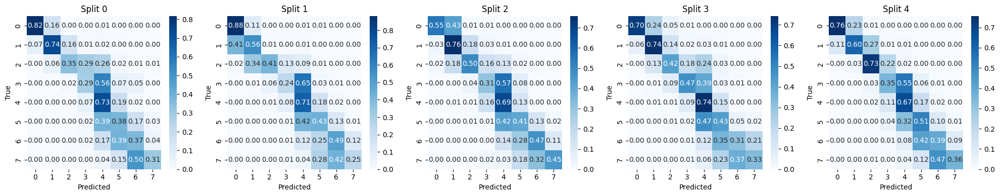



Adience_256x256_resnet50_imagenet_noisy_dldl_v2_smcarl_v3
trn|val|tst accs: 0.4764 ± 0.0289 | 0.3014 ± 0.0264 | 0.4456 ± 0.0211
trn|val|tst maes: 0.8432 ± 0.0694 | 1.4164 ± 0.0362 | 0.7352 ± 0.0469
trn|val|tst f1s : 0.4842 ± 0.0301 | 0.3010 ± 0.0254 | 0.4378 ± 0.0295


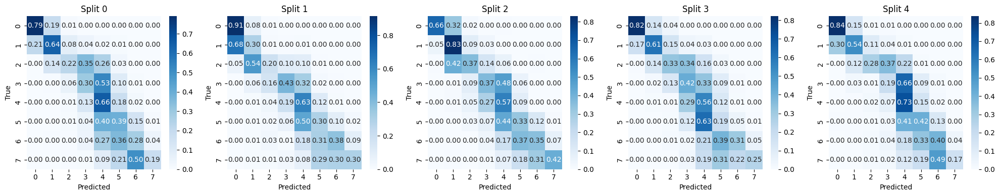



Adience_256x256_resnet50_imagenet_noisy_dldl_v2_corrected
trn|val|tst accs: 0.3918 ± 0.0228 | 0.3175 ± 0.0229 | 0.4813 ± 0.0218
trn|val|tst maes: 1.0702 ± 0.1048 | 1.3769 ± 0.0316 | 0.6637 ± 0.0326
trn|val|tst f1s : 0.3938 ± 0.0221 | 0.3197 ± 0.0223 | 0.4637 ± 0.0285


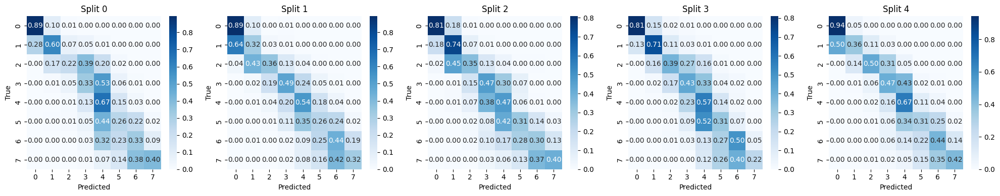



Adience_256x256_resnet50_imagenet_noisy_dldl_v2_a1_b9
trn|val|tst accs: 0.5050 ± 0.0817 | 0.2901 ± 0.0328 | 0.4311 ± 0.0197
trn|val|tst maes: 0.7913 ± 0.1912 | 1.4305 ± 0.0575 | 0.7579 ± 0.0436
trn|val|tst f1s : 0.5105 ± 0.0895 | 0.2861 ± 0.0331 | 0.4089 ± 0.0137


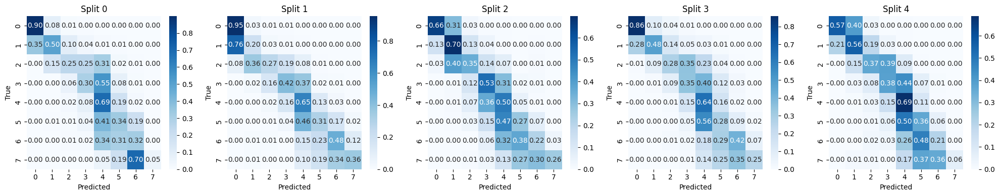



Adience_256x256_resnet50_imagenet_noisy_dldl_v2_a2_b2
trn|val|tst accs: 0.4894 ± 0.0945 | 0.2690 ± 0.0285 | 0.3760 ± 0.0234
trn|val|tst maes: 0.9010 ± 0.2293 | 1.4593 ± 0.0502 | 0.8773 ± 0.0399
trn|val|tst f1s : 0.5013 ± 0.0981 | 0.2660 ± 0.0302 | 0.3689 ± 0.0191


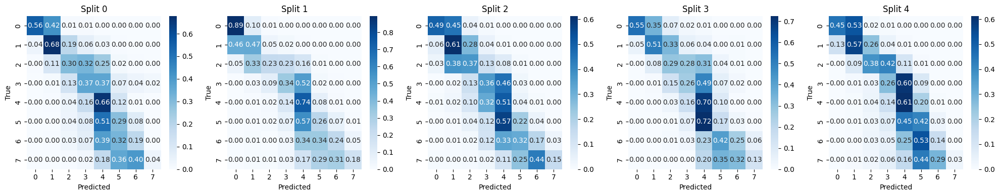



Adience_256x256_resnet50_imagenet_noisy_dldl_v2_a2_b5
trn|val|tst accs: 0.5059 ± 0.0403 | 0.2805 ± 0.0393 | 0.3991 ± 0.0327
trn|val|tst maes: 0.8160 ± 0.1335 | 1.4408 ± 0.0610 | 0.8269 ± 0.0572
trn|val|tst f1s : 0.5175 ± 0.0394 | 0.2787 ± 0.0416 | 0.3937 ± 0.0287


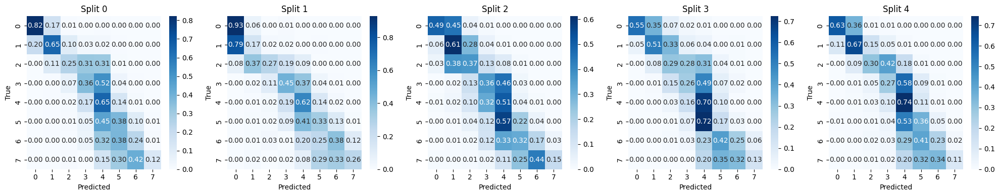



Adience_256x256_resnet50_imagenet_noisy_dldl_v2_a2_b8
trn|val|tst accs: 0.4752 ± 0.0375 | 0.3084 ± 0.0313 | 0.4600 ± 0.0119
trn|val|tst maes: 0.8516 ± 0.0915 | 1.4087 ± 0.0475 | 0.7192 ± 0.0393
trn|val|tst f1s : 0.4822 ± 0.0388 | 0.3062 ± 0.0330 | 0.4377 ± 0.0059


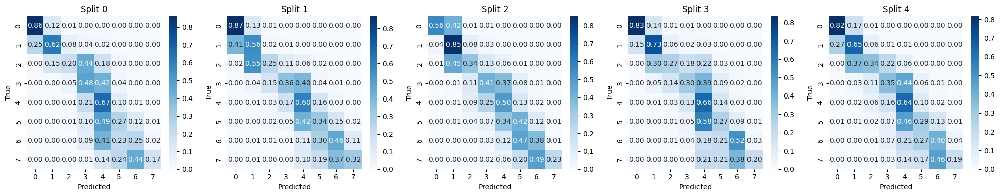



Adience_256x256_resnet50_imagenet_noisy_dldl_v2_a5_b2
trn|val|tst accs: 0.4967 ± 0.1086 | 0.2713 ± 0.0320 | 0.3740 ± 0.0200
trn|val|tst maes: 0.8893 ± 0.2514 | 1.4581 ± 0.0514 | 0.8807 ± 0.0331
trn|val|tst f1s : 0.5081 ± 0.1109 | 0.2691 ± 0.0354 | 0.3686 ± 0.0186


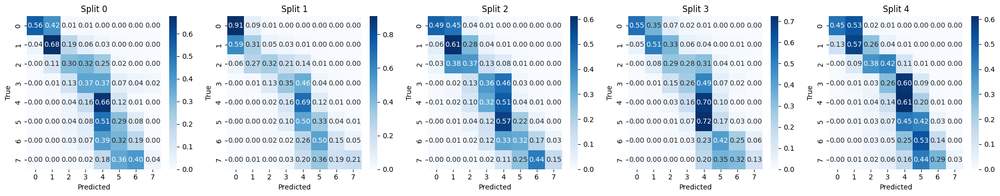



Adience_256x256_resnet50_imagenet_noisy_dldl_v2_a5_b5
trn|val|tst accs: 0.5465 ± 0.0551 | 0.2887 ± 0.0358 | 0.4222 ± 0.0394
trn|val|tst maes: 0.7201 ± 0.1366 | 1.4336 ± 0.0605 | 0.7983 ± 0.0515
trn|val|tst f1s : 0.5583 ± 0.0547 | 0.2890 ± 0.0394 | 0.4158 ± 0.0363


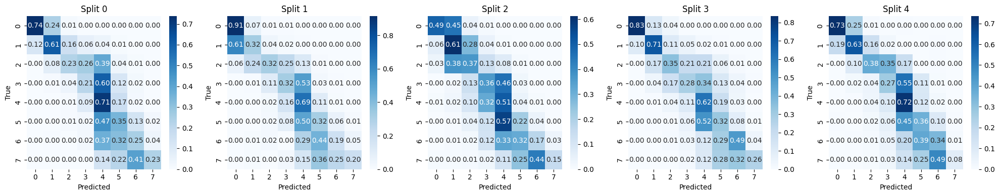



Adience_256x256_resnet50_imagenet_noisy_dldl_v2_a5_b8
trn|val|tst accs: 0.4883 ± 0.0594 | 0.3065 ± 0.0294 | 0.4496 ± 0.0224
trn|val|tst maes: 0.8323 ± 0.1358 | 1.3994 ± 0.0433 | 0.7330 ± 0.0581
trn|val|tst f1s : 0.4969 ± 0.0614 | 0.3065 ± 0.0297 | 0.4388 ± 0.0221


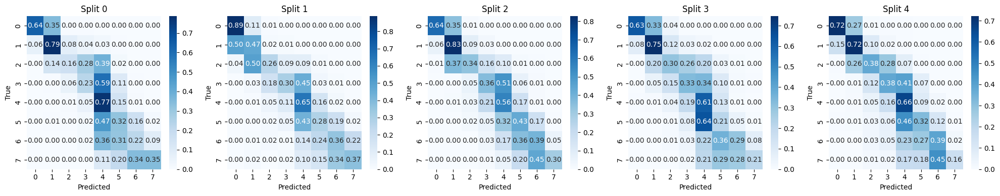



Adience_256x256_resnet50_imagenet_noisy_dldl_v2_a8_b2
trn|val|tst accs: 0.5392 ± 0.1288 | 0.2704 ± 0.0192 | 0.3854 ± 0.0276
trn|val|tst maes: 0.7947 ± 0.2983 | 1.4599 ± 0.0388 | 0.8760 ± 0.0350
trn|val|tst f1s : 0.5510 ± 0.1328 | 0.2696 ± 0.0197 | 0.3817 ± 0.0322


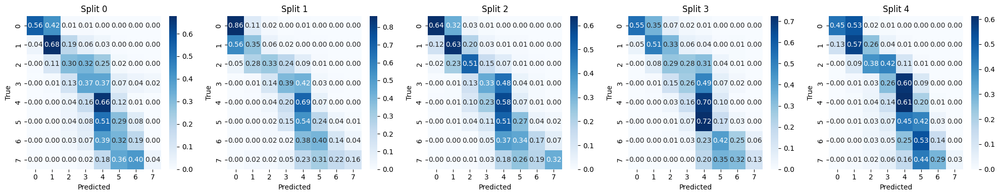



Adience_256x256_resnet50_imagenet_noisy_dldl_v2_a8_b5
trn|val|tst accs: 0.5143 ± 0.0447 | 0.2906 ± 0.0401 | 0.4150 ± 0.0375
trn|val|tst maes: 0.7997 ± 0.1239 | 1.4423 ± 0.0679 | 0.8147 ± 0.0681
trn|val|tst f1s : 0.5243 ± 0.0433 | 0.2912 ± 0.0437 | 0.4003 ± 0.0305


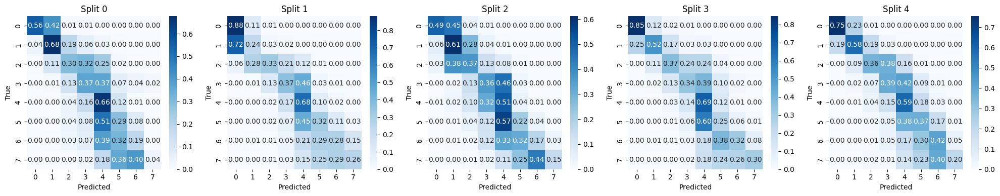



Adience_256x256_resnet50_imagenet_noisy_dldl_v2_a8_b8
trn|val|tst accs: 0.5455 ± 0.0524 | 0.2988 ± 0.0269 | 0.4497 ± 0.0456
trn|val|tst maes: 0.7076 ± 0.1084 | 1.4242 ± 0.0418 | 0.7463 ± 0.0897
trn|val|tst f1s : 0.5532 ± 0.0559 | 0.2999 ± 0.0290 | 0.4317 ± 0.0466


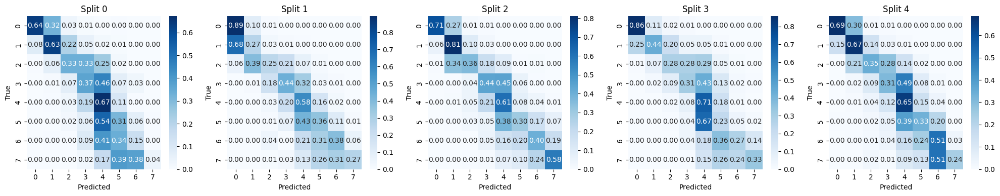



Adience_256x256_resnet50_imagenet_noisy_dldl_v2_a8_b8
trn|val|tst accs: 0.5455 ± 0.0524 | 0.2988 ± 0.0269 | 0.4497 ± 0.0456
trn|val|tst maes: 0.7076 ± 0.1084 | 1.4242 ± 0.0418 | 0.7463 ± 0.0897
trn|val|tst f1s : 0.5532 ± 0.0559 | 0.2999 ± 0.0290 | 0.4317 ± 0.0466


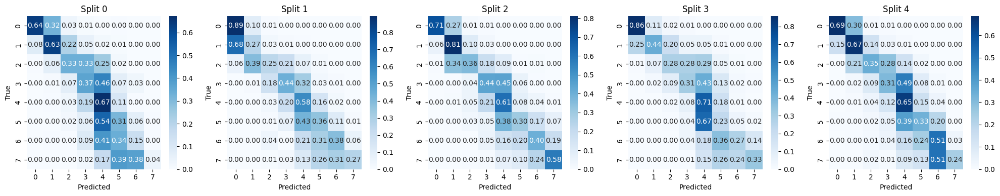



Adience_256x256_resnet50_imagenet_noisy_dldl_v2_std1e-5
trn|val|tst accs: 0.4519 ± 0.1102 | 0.2732 ± 0.0262 | 0.3897 ± 0.0470
trn|val|tst maes: 1.0670 ± 0.2210 | 1.4810 ± 0.0542 | 0.9246 ± 0.0896
trn|val|tst f1s : 0.4566 ± 0.1239 | 0.2700 ± 0.0313 | 0.3848 ± 0.0411


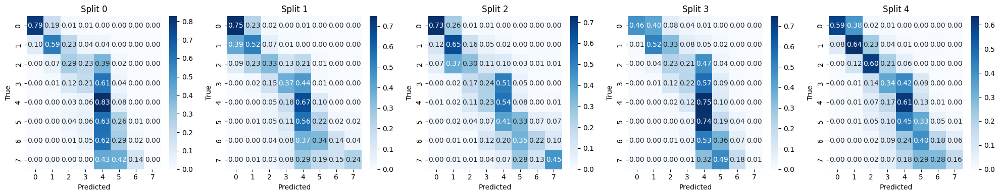



Adience_256x256_resnet50_imagenet_noisy_dldl_v2_std25
trn|val|tst accs: 0.4765 ± 0.0952 | 0.2942 ± 0.0294 | 0.4261 ± 0.0356
trn|val|tst maes: 0.9326 ± 0.2487 | 1.4377 ± 0.0540 | 0.8139 ± 0.1148
trn|val|tst f1s : 0.4807 ± 0.1038 | 0.2937 ± 0.0331 | 0.4169 ± 0.0333


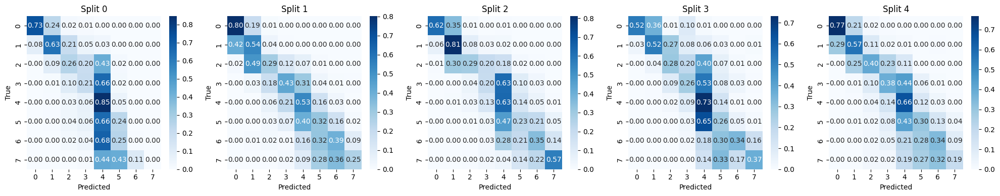



Adience_256x256_resnet50_imagenet_noisy_dldl_v2_std50
trn|val|tst accs: 0.4993 ± 0.0485 | 0.3055 ± 0.0230 | 0.4531 ± 0.0267
trn|val|tst maes: 0.8134 ± 0.1007 | 1.4175 ± 0.0483 | 0.7284 ± 0.0470
trn|val|tst f1s : 0.5081 ± 0.0518 | 0.3067 ± 0.0229 | 0.4432 ± 0.0269


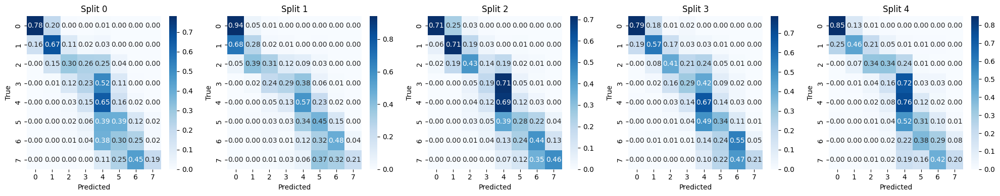



Adience_256x256_resnet50_imagenet_noisy_dldl_v2_std100
trn|val|tst accs: 0.4714 ± 0.0448 | 0.2990 ± 0.0309 | 0.4423 ± 0.0229
trn|val|tst maes: 0.8543 ± 0.1189 | 1.4043 ± 0.0473 | 0.7440 ± 0.0496
trn|val|tst f1s : 0.4815 ± 0.0465 | 0.3000 ± 0.0346 | 0.4325 ± 0.0215


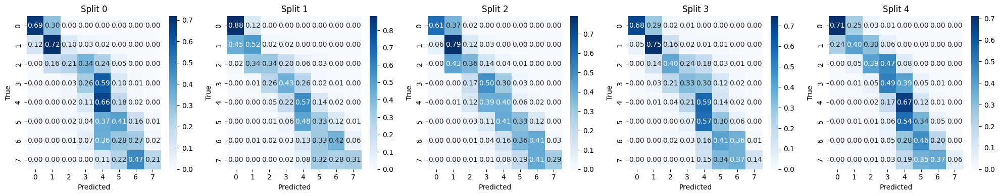

In [6]:
data_root = '../facebase/data'
result_root = '../facebase/results'
experiments = ['Adience_256x256_resnet50_imagenet_dldl_v2_clean',
               'Adience_256x256_resnet50_imagenet_dldl_v2_noisy',
               'Adience_256x256_resnet50_imagenet_noisy_dldl_v2_clean_carl',
            #    'Adience_256x256_resnet50_imagenet_noisy_dldl_v2_carl_v4',
            #    'Adience_256x256_resnet50_imagenet_noisy_dldl_v2_carl_v5',
            #    'Adience_256x256_resnet50_imagenet_noisy_dldl_v2_carl_sigma',
            #    'Adience_256x256_resnet50_imagenet_noisy_dldl_v2_carl_mean',
            #    'Adience_256x256_resnet50_imagenet_noisy_dldl_v2_sync_1_best_skip',
            #    'Adience_256x256_resnet50_imagenet_noisy_dldl_v2_sync_1_best_skip_v2',
            #    'Adience_256x256_resnet50_imagenet_noisy_dldl_v2_carl',
            #    'Adience_256x256_resnet50_imagenet_noisy_dldl_v2_carl_v2',
            #    'Adience_256x256_resnet50_imagenet_noisy_dldl_v2_carl_v3',
            #    'Adience_256x256_resnet50_imagenet_noisy_dldl_v2_carl_v4',
            #    'Adience_256x256_resnet50_imagenet_noisy_dldl_v2_carl_v5',
            #    'Adience_256x256_resnet50_imagenet_noisy_dldl_v2_carl_high_alpha',
            #    'Adience_256x256_resnet50_imagenet_noisy_dldl_v2_fcarl',
            #    'Adience_256x256_resnet50_imagenet_noisy_dldl_v2_fcarl_v2',
            #    'Adience_256x256_resnet50_imagenet_noisy_dldl_v2_smcarl',
            #    'Adience_256x256_resnet50_imagenet_noisy_dldl_v2_smcarl_v2',
            #    'Adience_256x256_resnet50_imagenet_noisy_dldl_v2_smcarl_v3',
               'Adience_256x256_resnet50_imagenet_noisy_dldl_v2_smed_carl_v2',
               'Adience_256x256_resnet50_imagenet_noisy_dldl_v2_clean_smcarl_v3',
               'Adience_256x256_resnet50_imagenet_noisy_dldl_v2_smcarl_v3_noisy_test',
               'Adience_256x256_resnet50_imagenet_dldl_v2_noisy_test',
               'Adience_256x256_resnet50_imagenet_noisy_dldl_v2_nr2_smcarl_v3',
               'Adience_256x256_resnet50_imagenet_dldl_v2_clean_new_mae',
               'Adience_256x256_resnet50_imagenet_cjs_clean',
               'Adience_256x256_resnet50_imagenet_cjs_clean_wd1e-5',
               'Adience_256x256_resnet50_imagenet_noisy_dldl_v2_smcarl_v3',
               'Adience_256x256_resnet50_imagenet_noisy_dldl_v2_corrected',
               'Adience_256x256_resnet50_imagenet_noisy_dldl_v2_a1_b9',
               'Adience_256x256_resnet50_imagenet_noisy_dldl_v2_a2_b2',
               'Adience_256x256_resnet50_imagenet_noisy_dldl_v2_a2_b5',
               'Adience_256x256_resnet50_imagenet_noisy_dldl_v2_a2_b8',
               'Adience_256x256_resnet50_imagenet_noisy_dldl_v2_a5_b2',
               'Adience_256x256_resnet50_imagenet_noisy_dldl_v2_a5_b5',
               'Adience_256x256_resnet50_imagenet_noisy_dldl_v2_a5_b8',
               'Adience_256x256_resnet50_imagenet_noisy_dldl_v2_a8_b2',
               'Adience_256x256_resnet50_imagenet_noisy_dldl_v2_a8_b5',
               'Adience_256x256_resnet50_imagenet_noisy_dldl_v2_a8_b8',
               'Adience_256x256_resnet50_imagenet_noisy_dldl_v2_a8_b8',
               'Adience_256x256_resnet50_imagenet_noisy_dldl_v2_std1e-5',
               'Adience_256x256_resnet50_imagenet_noisy_dldl_v2_std25',
               'Adience_256x256_resnet50_imagenet_noisy_dldl_v2_std50',
               'Adience_256x256_resnet50_imagenet_noisy_dldl_v2_std100',
               # 'Adience_256x256_resnet50_imagenet_cjs_clean_scheduler',
               ]

report_accuracy(data_root, result_root, experiments)

### Adience Finalized

Adience_256x256_resnet50_imagenet_dldl_v2_clean
trn|val|tst accs: 0.9402 ± 0.0367 | 0.4985 ± 0.0391 | 0.5063 ± 0.0221
trn|val|tst maes: 0.0615 ± 0.0382 | 0.6361 ± 0.0663 | 0.6343 ± 0.0505
trn|val|tst f1s : 0.9464 ± 0.0326 | 0.5030 ± 0.0367 | 0.5006 ± 0.0209


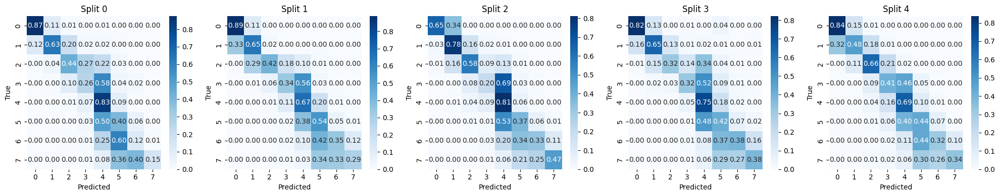



Adience_256x256_resnet50_imagenet_dldl_v2_nr2_noisy
trn|val|tst accs: 0.5809 ± 0.0470 | 0.3562 ± 0.0287 | 0.4452 ± 0.0211
trn|val|tst maes: 0.6817 ± 0.0785 | 1.1230 ± 0.0754 | 0.7618 ± 0.0482
trn|val|tst f1s : 0.5979 ± 0.0490 | 0.3594 ± 0.0273 | 0.4296 ± 0.0154


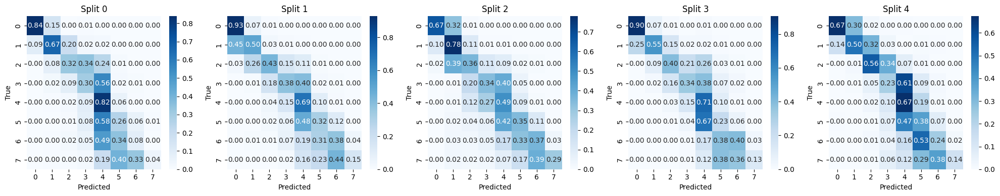



Adience_256x256_resnet50_imagenet_dldl_v2_noisy
trn|val|tst accs: 0.4327 ± 0.0480 | 0.2781 ± 0.0236 | 0.3929 ± 0.0279
trn|val|tst maes: 1.0444 ± 0.1160 | 1.4553 ± 0.0314 | 0.8649 ± 0.0382
trn|val|tst f1s : 0.4414 ± 0.0514 | 0.2771 ± 0.0267 | 0.3775 ± 0.0290


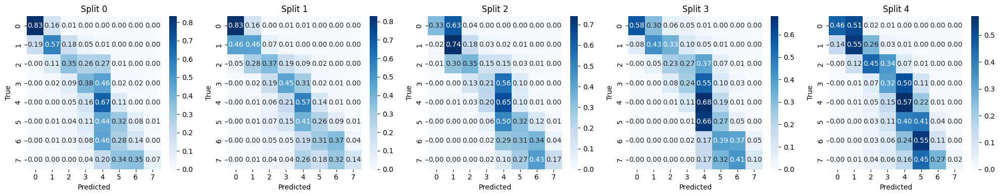



Adience_256x256_resnet50_imagenet_noisy_dldl_v2_clean_smcarl_v3
trn|val|tst accs: 0.8345 ± 0.0542 | 0.5516 ± 0.0237 | 0.5542 ± 0.0353
trn|val|tst maes: 0.1700 ± 0.0564 | 0.5551 ± 0.0432 | 0.5585 ± 0.0606
trn|val|tst f1s : 0.8290 ± 0.0523 | 0.5510 ± 0.0238 | 0.5477 ± 0.0308


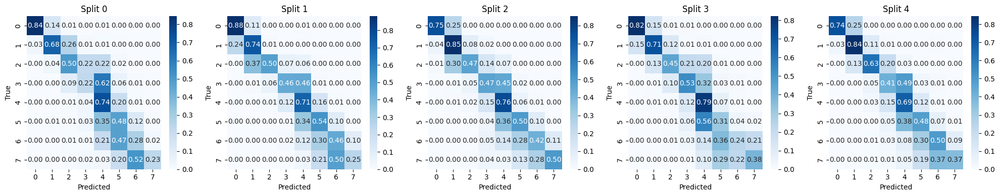



Adience_256x256_resnet50_imagenet_noisy_dldl_v2_nr2_smcarl_v3
trn|val|tst accs: 0.6207 ± 0.0460 | 0.3987 ± 0.0307 | 0.4988 ± 0.0226
trn|val|tst maes: 0.5615 ± 0.0826 | 1.0497 ± 0.0684 | 0.6463 ± 0.0394
trn|val|tst f1s : 0.6262 ± 0.0464 | 0.4057 ± 0.0262 | 0.4866 ± 0.0118


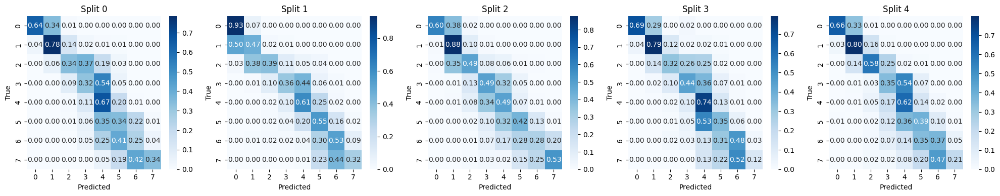



Adience_256x256_resnet50_imagenet_noisy_dldl_v2_smcarl_v3
trn|val|tst accs: 0.4764 ± 0.0289 | 0.3014 ± 0.0264 | 0.4456 ± 0.0211
trn|val|tst maes: 0.8432 ± 0.0694 | 1.4164 ± 0.0362 | 0.7352 ± 0.0469
trn|val|tst f1s : 0.4842 ± 0.0301 | 0.3010 ± 0.0254 | 0.4378 ± 0.0295


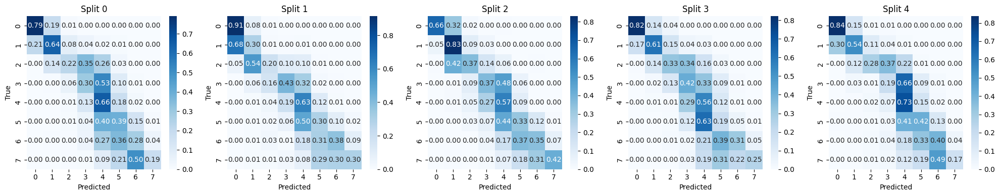



Adience_256x256_resnet50_imagenet_coral_clean_lr5-4
trn|val|tst accs: 0.6841 ± 0.0279 | 0.4669 ± 0.0230 | 0.4669 ± 0.0135
trn|val|tst maes: 0.3176 ± 0.0294 | 0.6648 ± 0.0553 | 0.6640 ± 0.0287
trn|val|tst f1s : 0.6314 ± 0.0201 | 0.4312 ± 0.0489 | 0.4357 ± 0.0276


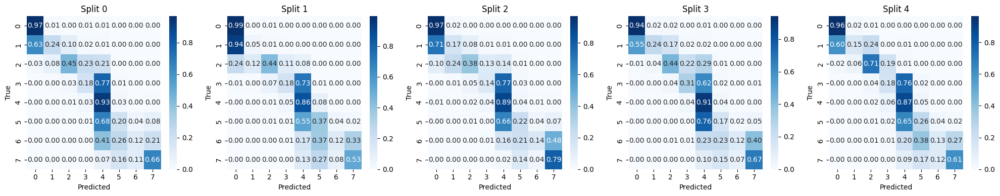



Adience_256x256_resnet50_imagenet_coral_nr2_noisy_lr5-4
trn|val|tst accs: 0.6160 ± 0.0257 | 0.3286 ± 0.0352 | 0.3985 ± 0.0102
trn|val|tst maes: 0.4194 ± 0.0267 | 1.1837 ± 0.0898 | 0.8349 ± 0.0289
trn|val|tst f1s : 0.5876 ± 0.0243 | 0.3168 ± 0.0437 | 0.3703 ± 0.0267


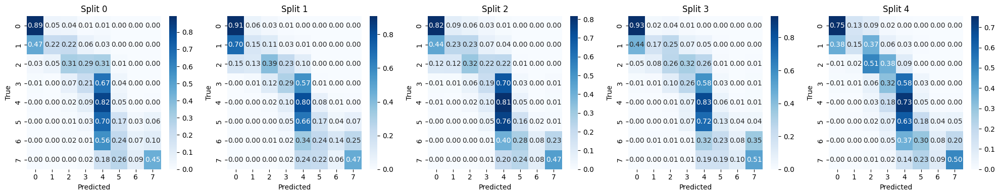



Adience_256x256_resnet50_imagenet_coral_noisy_lr5-4
trn|val|tst accs: 0.5899 ± 0.0243 | 0.2327 ± 0.0230 | 0.3312 ± 0.0245
trn|val|tst maes: 0.4709 ± 0.0342 | 1.5758 ± 0.0577 | 1.0427 ± 0.0676
trn|val|tst f1s : 0.5620 ± 0.0272 | 0.2261 ± 0.0257 | 0.3136 ± 0.0383


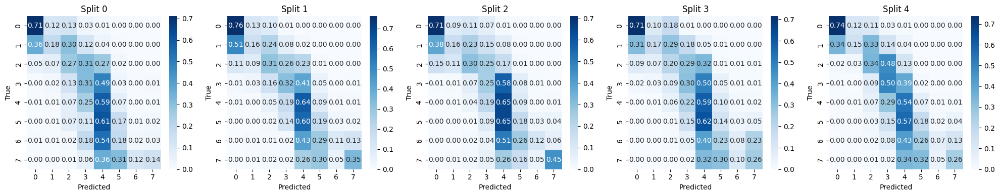



Adience_256x256_resnet50_imagenet_noisy_dldl_v2_clean_corrected
trn|val|tst accs: 0.6398 ± 0.0078 | 0.5786 ± 0.0209 | 0.5968 ± 0.0193
trn|val|tst maes: 0.4076 ± 0.0110 | 0.5193 ± 0.0280 | 0.4929 ± 0.0296
trn|val|tst f1s : 0.6321 ± 0.0102 | 0.5751 ± 0.0189 | 0.5935 ± 0.0172


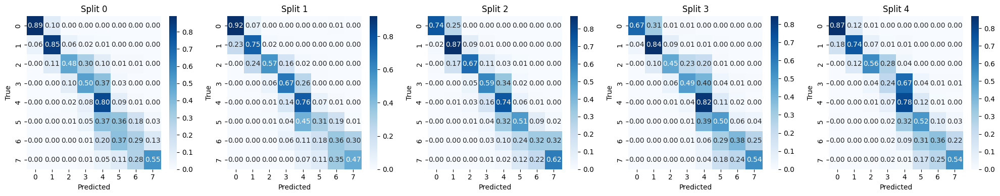



Adience_256x256_resnet50_imagenet_noisy_dldl_v2_nr2_corrected
trn|val|tst accs: 0.5175 ± 0.0026 | 0.4288 ± 0.0232 | 0.5460 ± 0.0182
trn|val|tst maes: 0.7312 ± 0.0246 | 0.9909 ± 0.0550 | 0.5642 ± 0.0400
trn|val|tst f1s : 0.5167 ± 0.0025 | 0.4347 ± 0.0227 | 0.5279 ± 0.0178


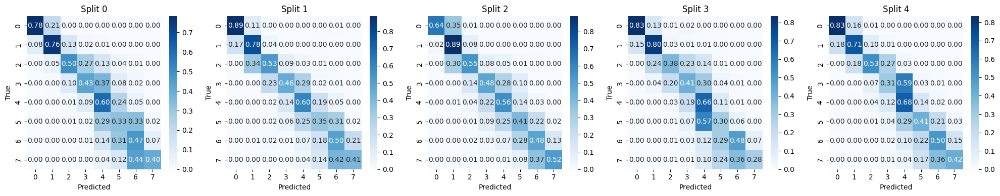



Adience_256x256_resnet50_imagenet_noisy_dldl_v2_corrected
trn|val|tst accs: 0.3918 ± 0.0228 | 0.3175 ± 0.0229 | 0.4813 ± 0.0218
trn|val|tst maes: 1.0702 ± 0.1048 | 1.3769 ± 0.0316 | 0.6637 ± 0.0326
trn|val|tst f1s : 0.3938 ± 0.0221 | 0.3197 ± 0.0223 | 0.4637 ± 0.0285


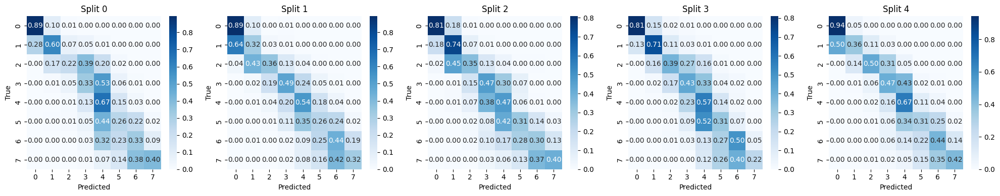



Adience_256x256_resnet50_imagenet_noisy_dldl_v2_clean_corrected_outlier_free
trn|val|tst accs: 0.6473 ± 0.0045 | 0.5794 ± 0.0255 | 0.5920 ± 0.0206
trn|val|tst maes: 0.3856 ± 0.0071 | 0.5042 ± 0.0395 | 0.5041 ± 0.0292
trn|val|tst f1s : 0.6400 ± 0.0057 | 0.5783 ± 0.0211 | 0.5900 ± 0.0181


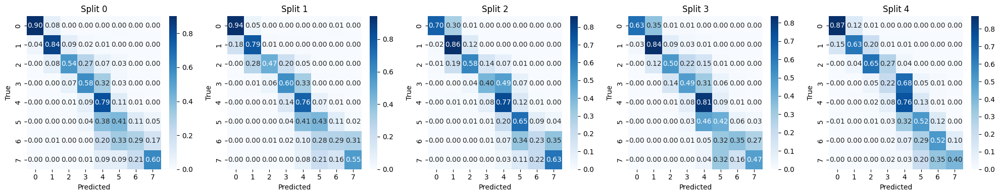



Adience_256x256_resnet50_imagenet_noisy_dldl_v2_clean_corrected_outlier_free_c75
trn|val|tst accs: 0.6840 ± 0.0098 | 0.6128 ± 0.0241 | 0.5954 ± 0.0136
trn|val|tst maes: 0.3225 ± 0.0128 | 0.4346 ± 0.0399 | 0.5018 ± 0.0274
trn|val|tst f1s : 0.6773 ± 0.0128 | 0.6058 ± 0.0194 | 0.5889 ± 0.0155


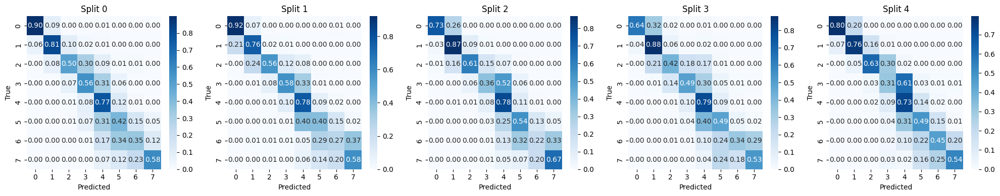



Adience_256x256_resnet50_imagenet_noisy_dldl_v2_nr2_corrected_outlier_free
trn|val|tst accs: 0.5358 ± 0.0102 | 0.4459 ± 0.0106 | 0.5476 ± 0.0228
trn|val|tst maes: 0.6236 ± 0.0372 | 0.8338 ± 0.0425 | 0.5530 ± 0.0336
trn|val|tst f1s : 0.5334 ± 0.0082 | 0.4506 ± 0.0104 | 0.5332 ± 0.0218


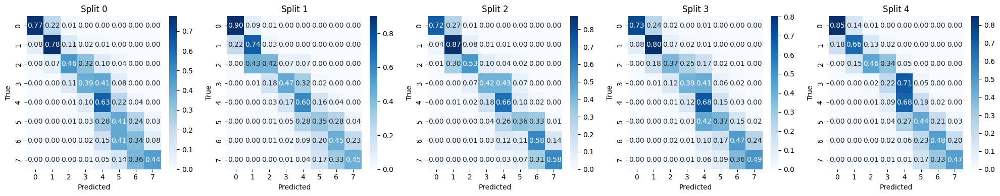



Adience_256x256_resnet50_imagenet_noisy_dldl_v2_nr2_corrected_outlier_free_c75
trn|val|tst accs: 0.6377 ± 0.0048 | 0.5275 ± 0.0198 | 0.5624 ± 0.0185
trn|val|tst maes: 0.3744 ± 0.0028 | 0.5750 ± 0.0381 | 0.5366 ± 0.0347
trn|val|tst f1s : 0.6282 ± 0.0054 | 0.5300 ± 0.0126 | 0.5402 ± 0.0079


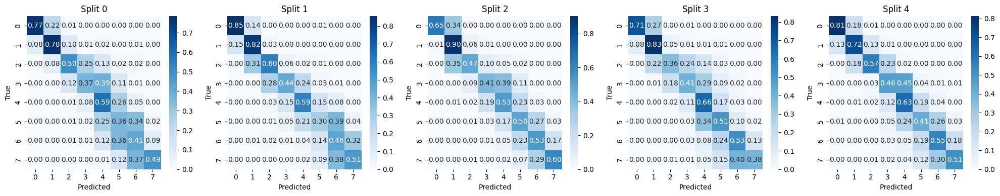



Adience_256x256_resnet50_imagenet_noisy_dldl_v2_corrected_outlier_free
trn|val|tst accs: 0.4091 ± 0.0104 | 0.3366 ± 0.0303 | 0.4920 ± 0.0112
trn|val|tst maes: 0.9000 ± 0.0288 | 1.1815 ± 0.0878 | 0.6482 ± 0.0228
trn|val|tst f1s : 0.4116 ± 0.0104 | 0.3415 ± 0.0283 | 0.4748 ± 0.0173


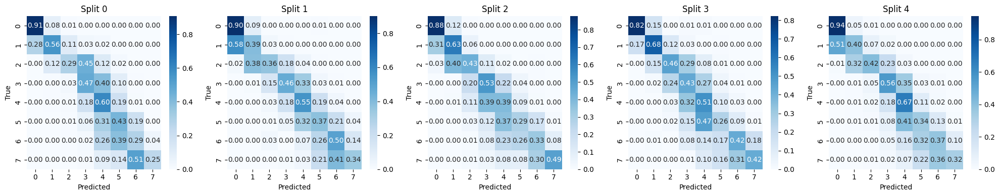



Adience_256x256_resnet50_imagenet_noisy_dldl_v2_corrected_outlier_free_c75
trn|val|tst accs: 0.5541 ± 0.0221 | 0.4283 ± 0.0310 | 0.4950 ± 0.0221
trn|val|tst maes: 0.4885 ± 0.0555 | 0.7818 ± 0.0770 | 0.6283 ± 0.0379
trn|val|tst f1s : 0.5515 ± 0.0170 | 0.4311 ± 0.0331 | 0.4723 ± 0.0239


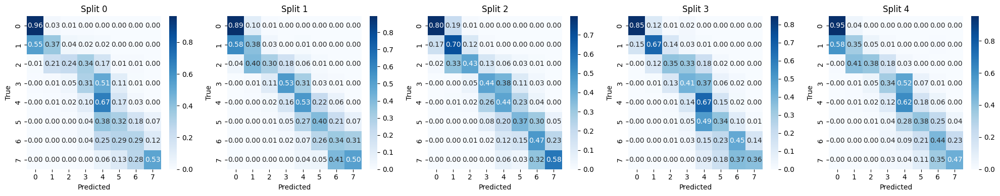



Adience_256x256_resnet50_imagenet_noisy_dldl_v2_corrected_outlier_free_c100
trn|val|tst accs: 0.4140 ± 0.0128 | 0.3232 ± 0.0288 | 0.4885 ± 0.0106
trn|val|tst maes: 0.8881 ± 0.0575 | 1.2431 ± 0.0735 | 0.6477 ± 0.0254
trn|val|tst f1s : 0.4152 ± 0.0132 | 0.3270 ± 0.0288 | 0.4722 ± 0.0220


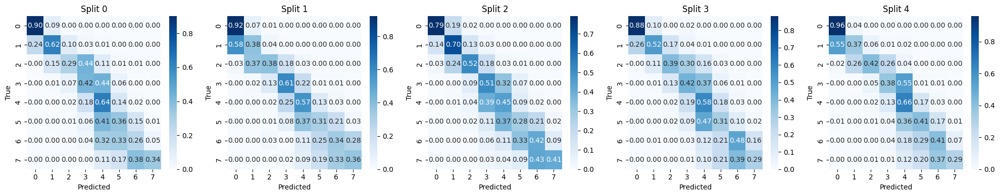

In [6]:
data_root = '../facebase/data'
result_root = '../facebase/results'
experiments = ['Adience_256x256_resnet50_imagenet_dldl_v2_clean',
               'Adience_256x256_resnet50_imagenet_dldl_v2_nr2_noisy',
               'Adience_256x256_resnet50_imagenet_dldl_v2_noisy',
               'Adience_256x256_resnet50_imagenet_noisy_dldl_v2_clean_smcarl_v3',
               'Adience_256x256_resnet50_imagenet_noisy_dldl_v2_nr2_smcarl_v3',
               'Adience_256x256_resnet50_imagenet_noisy_dldl_v2_smcarl_v3',
               'Adience_256x256_resnet50_imagenet_coral_clean_lr5-4',
               'Adience_256x256_resnet50_imagenet_coral_nr2_noisy_lr5-4',
               'Adience_256x256_resnet50_imagenet_coral_noisy_lr5-4',
               'Adience_256x256_resnet50_imagenet_noisy_dldl_v2_clean_corrected',
               'Adience_256x256_resnet50_imagenet_noisy_dldl_v2_nr2_corrected',
               'Adience_256x256_resnet50_imagenet_noisy_dldl_v2_corrected',
               'Adience_256x256_resnet50_imagenet_noisy_dldl_v2_clean_corrected_outlier_free',
               'Adience_256x256_resnet50_imagenet_noisy_dldl_v2_clean_corrected_outlier_free_c75',
               'Adience_256x256_resnet50_imagenet_noisy_dldl_v2_nr2_corrected_outlier_free',
               'Adience_256x256_resnet50_imagenet_noisy_dldl_v2_nr2_corrected_outlier_free_c75',
               'Adience_256x256_resnet50_imagenet_noisy_dldl_v2_corrected_outlier_free',
               'Adience_256x256_resnet50_imagenet_noisy_dldl_v2_corrected_outlier_free_c75',
               'Adience_256x256_resnet50_imagenet_noisy_dldl_v2_corrected_outlier_free_c100',
               ]

report_accuracy(data_root, result_root, experiments)